# Danh sách thành viên:
Khai phá dữ liệu tâm trạng theo âm nhạc

# THÔNG TIN TẬP DỮ LIỆU

Một số các thuộc tính được liệt kê bên dưới đây là các đặc trưng của một bộ dữ liệu âm nhạc, mô tả các thuộc tính của các bài hát được thu thập và sử dụng để phát triển các mô hình dự đoán và phân tích âm nhạc:

- danceability: Mức độ phù hợp để nhảy theo nhạc, được tính dựa trên các yếu tố như nhịp điệu, âm sắc, động lực và độ phức tạp của bài hát.

- energy: Mức độ năng lượng và sức mạnh của bài hát, được tính dựa trên các yếu tố như độ ồn, tốc độ và cường độ của bài hát.

- loudness: Mức độ ồn của bài hát, được đo bằng đơn vị decibel (dB).

- speechiness: Mức độ có chứa giọng nói trong bài hát, được đo bằng tỷ lệ giọng nói so với âm nhạc trong bài hát.

- acousticness: Mức độ sử dụng nhạc cụ acoustics trong bài hát, được đo bằng tỷ lệ các âm thanh acoustics so với âm thanh điện tử trong bài hát.

- instrumentalness: Mức độ sử dụng nhạc cụ điện tử trong bài hát, được đo bằng tỷ lệ các âm thanh điện tử so với các âm thanh khác trong bài hát.

- liveness: Mức độ phát trực tiếp của bài hát, được đo bằng tỷ lệ giữa âm thanh phát trực tiếp và âm thanh trong studio trong bài hát.

- valence: Tính tích cực hoặc tiêu cực của bài hát, được đo bằng tỷ lệ các âm thanh tích cực so với các âm thanh tiêu cực trong bài hát.

- decade: Thời đại mà bài hát được phát hành, thường được xác định bởi năm phát hành của bài hát và được phân loại theo từng thập kỷ.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode,plot,iplot
import plotly.figure_factory as ff
import chart_studio.tools as tls
import chart_studio.plotly as py
from joblib import parallel_backend

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import apriori, association_rules
from apyori import apriori

In [2]:
df =pd.read_csv("spotify_dataset.csv")

In [3]:
df

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,popularity,decade
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.4900,0.000000,0.0779,0.8450,185.655,173533,3,32.94975,9,1,60s
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.0180,0.107000,0.1760,0.7970,101.801,213613,4,48.82510,10,0,60s
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.8460,0.000004,0.1190,0.9080,115.940,223960,4,37.22663,12,0,60s
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.7060,0.024600,0.0610,0.9670,105.592,157907,4,24.75484,8,0,60s
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.8570,0.000872,0.2130,0.9060,114.617,245600,4,21.79874,14,0,60s
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41094,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.8860,0.966000,0.3140,0.0361,72.272,150857,4,24.30824,7,0,10s
41095,Calling My Spirit,Kodak Black,spotify:track:2MShy1GSSgbmGUxADNIao5,0.910,0.366,1,-9.954,1,0.0941,0.0996,0.000000,0.2610,0.7400,119.985,152000,4,32.53856,8,1,10s
41096,Teenage Dream,Katy Perry,spotify:track:55qBw1900pZKfXJ6Q9A2Lc,0.719,0.804,10,-4.581,1,0.0355,0.0132,0.000003,0.1390,0.6050,119.999,227760,4,20.73371,7,1,10s
41097,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.9890,0.868000,0.1490,0.5600,120.030,213387,4,21.65301,14,0,10s


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41099 entries, 0 to 41098
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41099 non-null  object 
 1   artist            41099 non-null  object 
 2   uri               41099 non-null  object 
 3   danceability      41099 non-null  float64
 4   energy            41099 non-null  float64
 5   key               41099 non-null  int64  
 6   loudness          41099 non-null  float64
 7   mode              41099 non-null  int64  
 8   speechiness       41099 non-null  float64
 9   acousticness      41099 non-null  float64
 10  instrumentalness  41099 non-null  float64
 11  liveness          41099 non-null  float64
 12  valence           41099 non-null  float64
 13  tempo             41099 non-null  float64
 14  duration_ms       41099 non-null  int64  
 15  time_signature    41099 non-null  int64  
 16  chorus_hit        41099 non-null  float6

In [5]:
df.shape
df.isnull().sum()

track               0
artist              0
uri                 0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
chorus_hit          0
sections            0
popularity          0
decade              0
dtype: int64

# EDA

### Số bài hát nổi tiếng trong thập kỉ

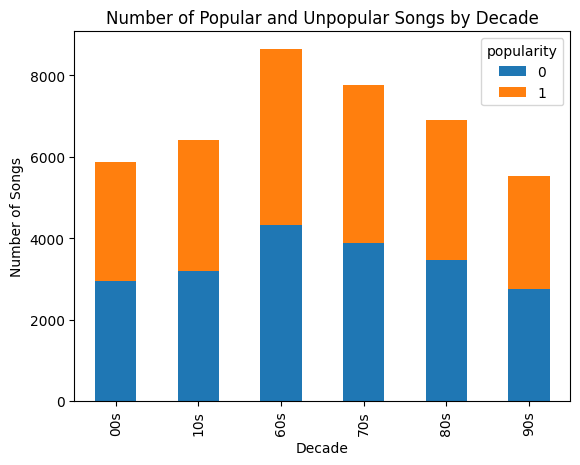

In [6]:
df_counts = df.groupby(['decade', 'popularity']).size().reset_index(name='count')

# Pivot the data to create a column chart
df_pivot = df_counts.pivot(index='decade', columns='popularity', values='count')
df_pivot.plot(kind='bar', stacked=True)

# Set the chart title and axis labels
plt.title('Number of Popular and Unpopular Songs by Decade')
plt.xlabel('Decade')
plt.ylabel('Number of Songs')

# Display the chart
plt.show()

### Trực quan hóa phân phối của các thuộc tính âm thanh (audio features) trong bộ dữ liệu âm nhạc :

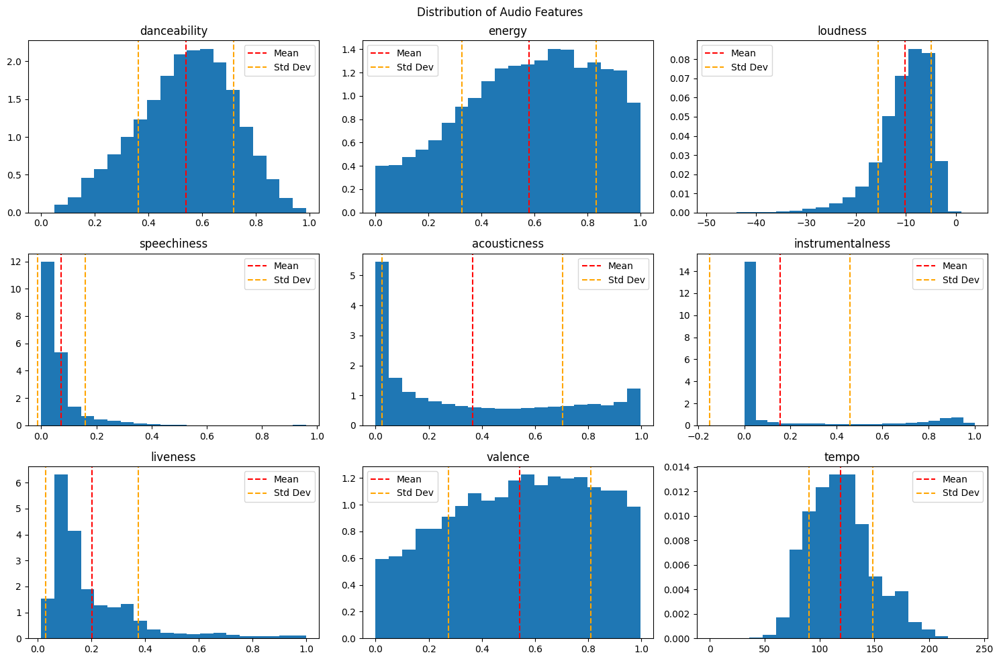

In [7]:
audio_features = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
means = df[audio_features].mean()
stds = df[audio_features].std()
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
axs = axs.flatten()
for i, feature in enumerate(audio_features):
    ax = axs[i]
    ax.hist(df[feature], bins=20, density=True)
    ax.set_title(feature)
    ax.axvline(means[feature], color='red', linestyle='--', label='Mean')
    ax.axvline(means[feature] - stds[feature], color='orange', linestyle='--', label='Std Dev')
    ax.axvline(means[feature] + stds[feature], color='orange', linestyle='--')
    ax.legend()
plt.suptitle('Distribution of Audio Features')
plt.tight_layout()
plt.show()

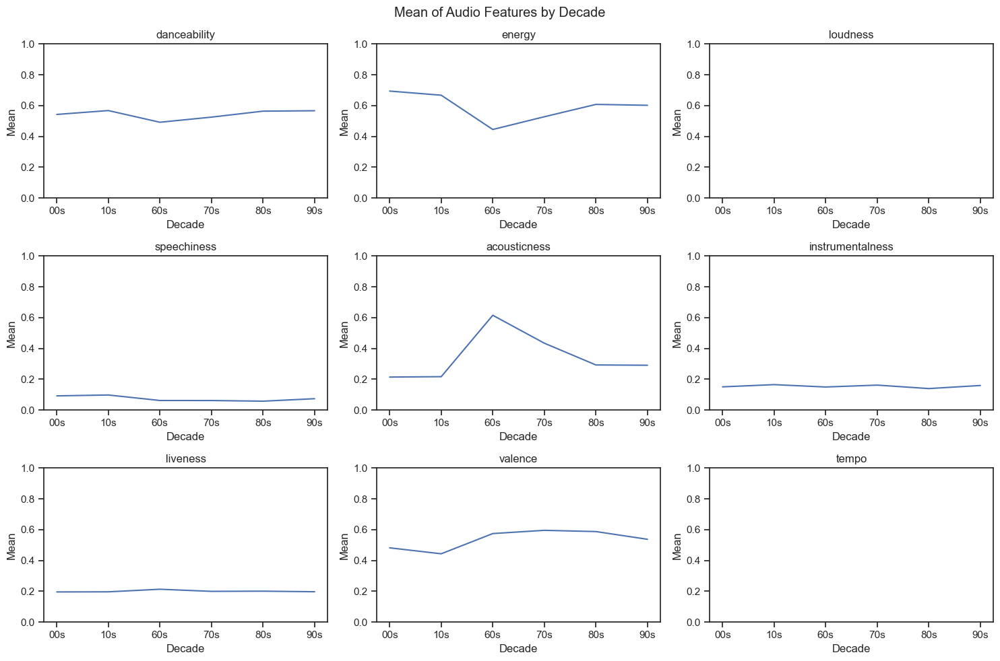

In [8]:
df['decade'] = pd.Categorical(df['decade'])

# Compute the mean of each audio feature for each decade
df_means = df.groupby('decade')[audio_features].mean()

# Plot the mean of each audio feature for each decade
sns.set(style='ticks')
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
axs = axs.flatten()

for i, feature in enumerate(audio_features):
    ax = axs[i]
    sns.lineplot(data=df_means, x='decade', y=feature, ax=ax)
    ax.set_title(feature)
    ax.set_xlabel('Decade')
    ax.set_ylabel('Mean')
    ax.set_ylim([0, 1])


plt.suptitle('Mean of Audio Features by Decade')
plt.tight_layout()
plt.show()

Lấy các thuộc tính được sử dụng để phân cụm :

In [9]:
song_prefs = df[['track','artist','uri','energy', 'tempo','speechiness', 'acousticness', 'instrumentalness', 'danceability', 'loudness', 'valence']].dropna()
X = song_prefs.drop(['track','artist','uri'],axis=1)

In [10]:
scaler = MinMaxScaler()
X.loudness = scaler.fit_transform(X.loudness.values.reshape(-1,1))
X.tempo = scaler.fit_transform(X.tempo.values.reshape(-1,1))

<Axes: >

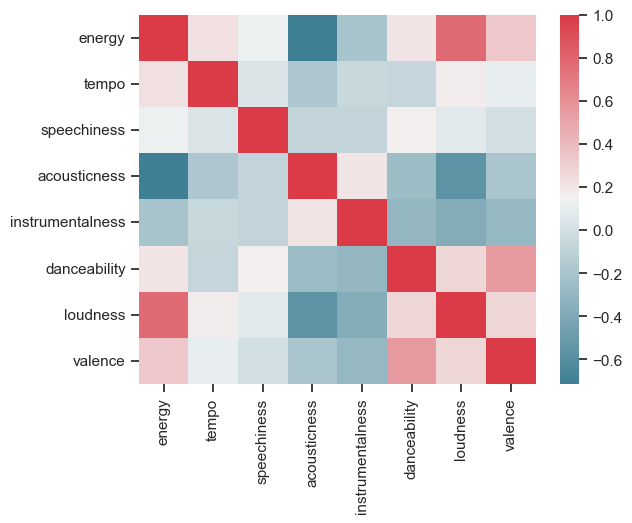

In [11]:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(X.corr(),cmap=cmap)

# Tiến hành phân cụm

In [12]:
inertia = {}
for n in range(1, 15):
    kmeans = KMeans(n_clusters=n, random_state=1, n_init=10).fit(X.values)
    inertia[n] = kmeans.inertia_

cluster_num = list(inertia.keys())

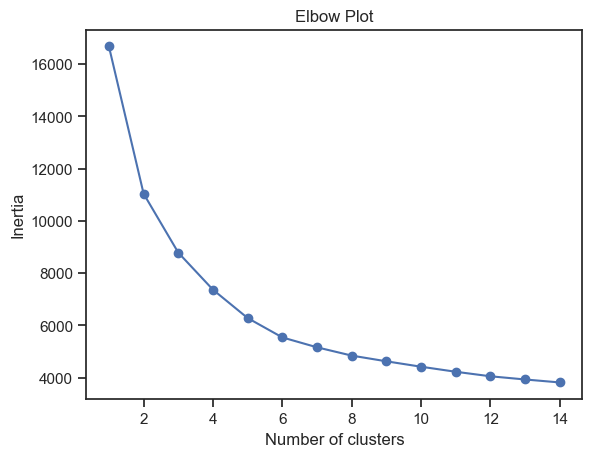

In [13]:
cluster_num = list(inertia.keys())
inertia_vals = list(inertia.values())
plt.plot(cluster_num, inertia_vals, '-o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Plot')
plt.show()

### Dựa vào mô hình chọn k = 4

In [14]:
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, n_init=10, max_iter=300, random_state=1).fit(X.values)
y_kmeans = kmeans.predict(X.values)

#### Xây dựng mô hình scatter 2D để quan sát:

In [15]:
pca_2D = PCA(n_components=2)
principal_components_2D = pca_2D.fit_transform(X.values)
pc2D = pd.DataFrame(principal_components_2D)

pc2D['label'] = [str(y) for y in y_kmeans]
pc2D.columns = ['x', 'y','label']

fig = px.scatter(pc2D, 
                 x='x', 
                 y='y',
                 color='label',
                 color_discrete_map={'0':'purple','1':'blue','2':'green','3':'red'},
                 category_orders={"label": ["0", "1", "2", "3"]})

In [16]:
print (pca_2D.explained_variance_ratio_, sum(pca_2D.explained_variance_ratio_))

[0.46410184 0.22521345] 0.6893152842296897


In [17]:
fig.show()

In [18]:
from mpl_toolkits.mplot3d import Axes3D

pca_3D = PCA(n_components=3)
principal_components_3D = pca_3D.fit_transform(X.values)
pc3D = pd.DataFrame(principal_components_3D)

pc3D['label'] = [str(y) for y in y_kmeans]
pc3D.columns = ['x', 'y', 'z', 'label']

fig = px.scatter_3d(pc3D, 
                 x='x', 
                 y='y',
                 z='z',
                 color='label',
                 color_discrete_map={'0':'purple','1':'blue','2':'green','3':'red'},
                 category_orders={"label": ["0", "1", "2", "3"]})

In [19]:
print (pca_3D.explained_variance_ratio_, sum(pca_3D.explained_variance_ratio_))

[0.46410184 0.22521345 0.14868459] 0.8379998722674153


In [20]:
fig.show()

Thống kê các bài hát thuộc các cụm:

C:\Users\quoct\AppData\Local\Temp\ipykernel_13868\2434313001.py:11: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



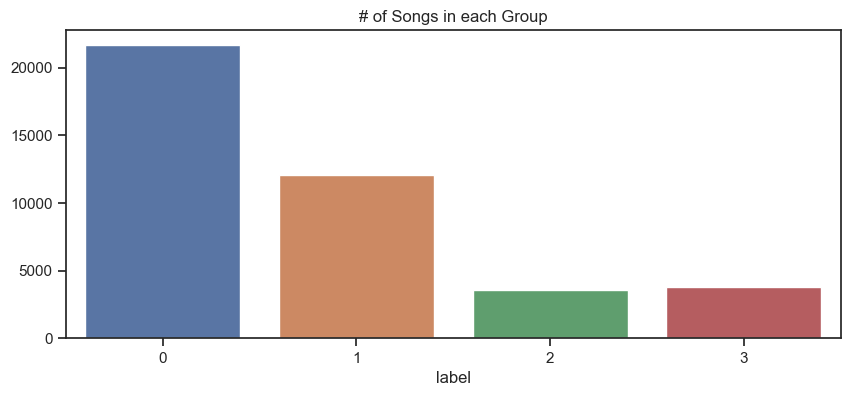

In [21]:
song_prefs['label'] = y_kmeans

fig = sns.barplot(x=song_prefs['label'].value_counts().index, 
                  y=song_prefs['label'].value_counts()
                 )

plt.title('# of Songs in each Group')
plt.ylabel('')
fig = fig.get_figure()
fig.set_size_inches(10, 4)
fig.show()

##### Tạo heatmap để kiểm tra:

In [22]:
song_prefs=song_prefs.drop(['track','artist','uri'],axis=1)

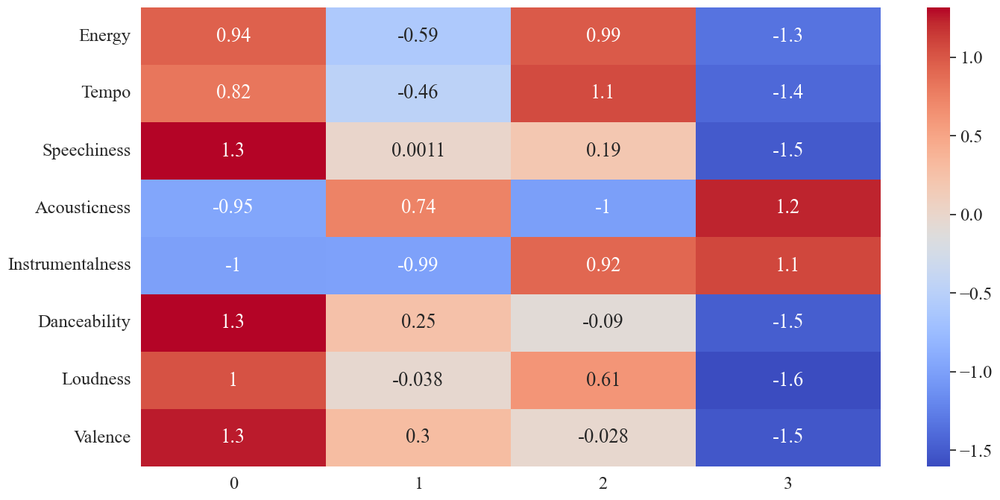

In [23]:
scaler = StandardScaler()
sns.set(font_scale=1.6,font='Times New Roman')
fig = sns.heatmap(scaler.fit_transform(song_prefs.groupby('label').mean()).T,
                  cmap='coolwarm',
                  yticklabels=[x.capitalize() for x in list(X.columns)],
                  annot=True)
fig = fig.get_figure()
fig.set_size_inches(16, 8)

# Đánh giá các thuật toán phân lớp:

In [24]:
# tạo tập train và test
scaler = StandardScaler()
x_train, x_test, y_train, y_test = train_test_split(scaler.fit_transform(X.values),y_kmeans, test_size=0.2, random_state=1)

##### DecisionTreeClassifier:

In [25]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()

# Train Decision Tree Classifer
model = model.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = model.predict(x_test)
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
print("Accuracy decisionTree:",metrics.accuracy_score(y_test, y_pred)*100)

Accuracy decisionTree: 97.82238442822384


##### KNeighborsClassifier:

In [26]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier()

# Train Decision Tree Classifer
model = model.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = model.predict(x_test)
print("Accuracy KNeighborsClassifier:",metrics.accuracy_score(y_test, y_pred)*100)

Accuracy KNeighborsClassifier: 97.06812652068126


#### RandomForestClassifier:

In [27]:
clf = RandomForestClassifier(n_estimators=30, random_state=10,criterion='entropy')
clf.fit(x_train, y_train)
ypred = clf.predict(x_test)

In [28]:
group_labels = list(X.columns)
print ([(x,y) for x,y in zip(list(np.round(clf.feature_importances_,2)),group_labels)])

[(0.12, 'energy'), (0.01, 'tempo'), (0.01, 'speechiness'), (0.37, 'acousticness'), (0.35, 'instrumentalness'), (0.03, 'danceability'), (0.07, 'loudness'), (0.04, 'valence')]


In [29]:
from sklearn.metrics import accuracy_score
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, clf.predict(x_test))*100)

Accuracy: 98.61313868613138


#### Xây dựng confusion_maxtrix để kiểm tra độ hiệu quả thuật toán:

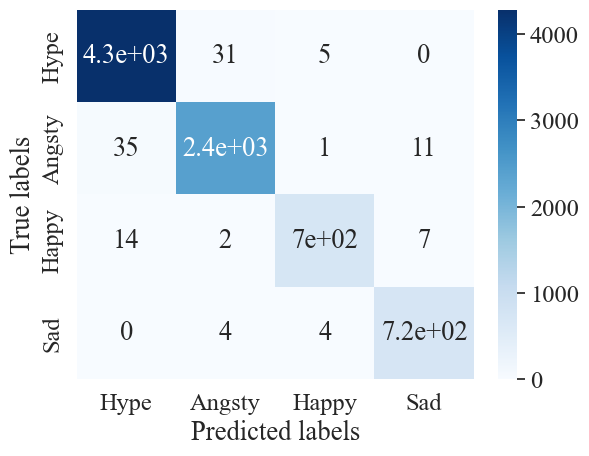

Accuracy Score 0.9861313868613139


In [30]:
from sklearn.metrics import confusion_matrix
moods = ['Hype','Angsty','Happy',"Sad"]
cm = confusion_matrix(y_test, ypred)
sns.heatmap(cm, annot=True, cmap='Blues',yticklabels=moods, xticklabels=moods)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')

# Hiển thị heatmap
plt.show()
print("Accuracy Score",accuracy_score(y_test,ypred))